# Interpolación (Splines paramétricos)

### CAPÍTULO 2

**Programación Científica 2026-1 · Universidad Nacional de Colombia**  
mbastidaso@unal.edu.co


[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/)

In [2]:
#!sudo apt-get update
#!sudo apt-get install texlive-latex-extra texlive-fonts-recommended dvipng cm-super

import numpy as np
import matplotlib.pyplot as plt

from scipy.interpolate import CubicSpline

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,

    # Ejes y Ticks
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "xtick.minor.visible": True,
    "ytick.minor.visible": True,
    "xtick.direction": "in",
    "ytick.direction": "in",

    # Grid                          # ← bug 1: sintaxis mezclada
    "grid.color"    : "gray",       # todo debe ir como claves del dict
    "grid.linewidth": 0.3,
    "grid.alpha"    : 0.3,
    "grid.linestyle": "--",

    # Estética
    "figure.dpi"        : 120,
    "axes.spines.top"   : False,
    "axes.spines.right" : False,
    "savefig.bbox"      : "tight",
    "savefig.dpi"       : 300,
})

print('Configuración OK')

Configuración OK


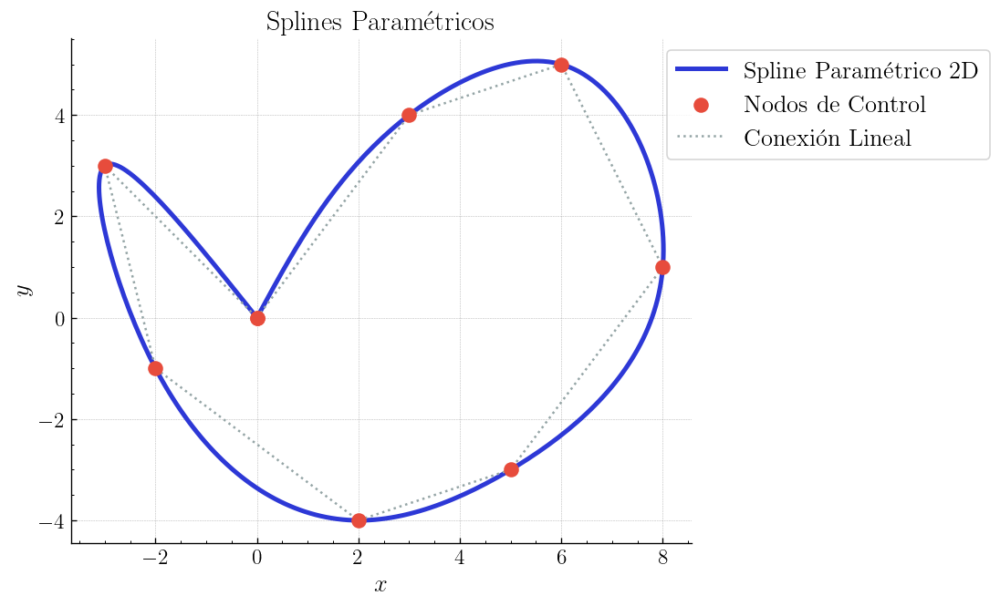

In [3]:

# ==========================================
# 1. LOS DATOS (El circuito a dibujar)
# ==========================================
# Vamos a hacer una figura de "8" que reprobaría la prueba de la línea vertical
X_puntos = np.array([0, 3, 6, 8, 5, 2, -2, -3, 0])
Y_puntos = np.array([0, 4, 5, 1, -3, -4, -1, 3, 0])
n = len(X_puntos)

# ==========================================
# 2. EL "RELOJ" INVISIBLE (Parametrización por longitud de cuerda)
# ==========================================
# Calculamos la distancia euclidiana entre cada par de puntos consecutivos
distancias = np.sqrt(np.diff(X_puntos)**2 + np.diff(Y_puntos)**2)

# Inicializamos el vector de tiempo 't'
t_puntos = np.zeros(n)
# El tiempo en cada nodo es la suma acumulada de las distancias anteriores
t_puntos[1:] = np.cumsum(distancias)

# ==========================================
# 3. EL RECICLAJE (Dos Splines 1D independientes)
# ==========================================
# Usamos CubicSpline puramente como un solucionador 1D clásico.
# bc_type='natural' hace que la aceleración sea 0 al inicio y al final.
spline_X = CubicSpline(t_puntos, X_puntos, bc_type='natural')
spline_Y = CubicSpline(t_puntos, Y_puntos, bc_type='natural')

# ==========================================
# 4. EVALUACIÓN DE LA CURVA 2D
# ==========================================
# Creamos un reloj denso de alta resolución que vaya desde t=0 hasta el t_final
t_denso = np.linspace(t_puntos[0], t_puntos[-1], 300)

# Evaluamos las X y las Y por separado en el mismo instante de tiempo 't'
X_suave = spline_X(t_denso)
Y_suave = spline_Y(t_denso)

# ==========================================
# 5. VISUALIZACIÓN
# ==========================================
fig, ax = plt.subplots(figsize=(10, 6))

# Dibujamos la pista suave
ax.plot(X_suave, Y_suave, color="#2d38d6", linewidth=3, label='Spline Paramétrico 2D')

# Dibujamos los puntos originales
ax.scatter(X_puntos, Y_puntos, color='#e74c3c', s=80, zorder=5, label='Nodos de Control')

# Dibujamos líneas rectas finas para que vean la diferencia entre recta y curva
ax.plot(X_puntos, Y_puntos, color='#95a5a6', linestyle=':', linewidth=1.5, label='Conexión Lineal')

# Formato estético
ax.set_title("Splines Paramétricos")
ax.set_aspect('equal') # IMPORTANTE: Para que la geometría 2D no se deforme
ax.grid(True, linestyle='--', alpha=0.6)
plt.xlabel('$x$')
plt.ylabel('$y$')

ax.legend(bbox_to_anchor=(1.5, 1), loc='upper right')

plt.show()


### ¿Hay otra forma en Python? 

**Ejercicio:** En la librería de scipy hay métodos para hacer splines. Experimentemos!

# Curvas de Bezier

### Las curvas de Bézier han sido ampliamente usadas en los gráficos generados por ordenador para modelado de curvas suaves.

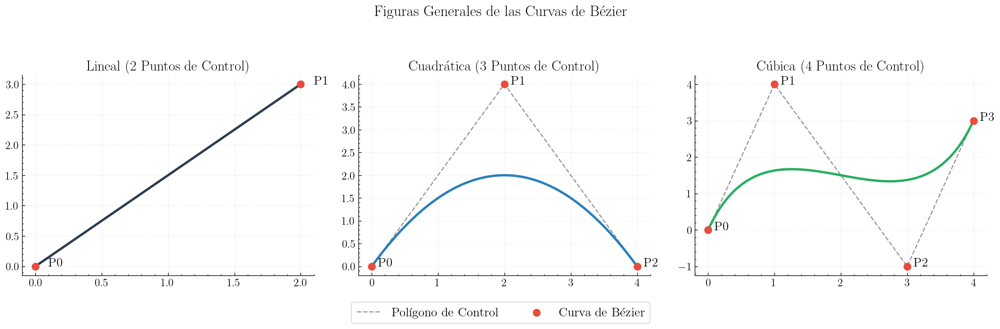

In [4]:

# Generamos un vector de tiempo denso entre 0 y 1 para dibujar las curvas suaves
t = np.linspace(0, 1, 100)

# CONFIGURACIÓN DE LOS PUNTOS DE CONTROL
# ==========================================
# 1. Lineal (2 puntos)
P_lineal = np.array([[0, 0], [2, 3]])

# 2. Cuadrática (3 puntos)
P_cuadrática = np.array([[0, 0], [2, 4], [4, 0]])

# 3. Cúbica (4 puntos)
P_cúbica = np.array([[0, 0], [1, 4], [3, -1], [4, 3]])


# FÓRMULAS ALGEBRAICAS EXPLÍCITAS
# ==========================================
# Grado 1: B(t) = (1-t)*P0 + t*P1
x_lin = (1 - t) * P_lineal[0, 0] + t * P_lineal[1, 0]
y_lin = (1 - t) * P_lineal[0, 1] + t * P_lineal[1, 1]

# Grado 2: B(t) = (1-t)^2*P0 + 2(1-t)t*P1 + t^2*P2
x_quad = (1 - t)**2 * P_cuadrática[0, 0] + 2 * (1 - t) * t * P_cuadrática[1, 0] + t**2 * P_cuadrática[2, 0]
y_quad = (1 - t)**2 * P_cuadrática[0, 1] + 2 * (1 - t) * t * P_cuadrática[1, 1] + t**2 * P_cuadrática[2, 1]

# Grado 3: B(t) = (1-t)^3*P0 + 3(1-t)^2*t*P1 + 3(1-t)t^2*P2 + t^3*P3
x_cub = (1 - t)**3 * P_cúbica[0, 0] + 3 * (1 - t)**2 * t * P_cúbica[1, 0] + 3 * (1 - t) * t**2 * P_cúbica[2, 0] + t**3 * P_cúbica[3, 0]
y_cub = (1 - t)**3 * P_cúbica[0, 1] + 3 * (1 - t)**2 * t * P_cúbica[1, 1] + 3 * (1 - t) * t**2 * P_cúbica[2, 1] + t**3 * P_cúbica[3, 1]


# CONSTRUCCIÓN DEL GRÁFICO (3 PANELES)
# ==========================================
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Figuras Generales de las Curvas de Bézier",  fontweight='bold', y=1.05)

# --- PANEL 1: CURVA LINEAL (Grado 1) ---
ax1.plot(P_lineal[:, 0], P_lineal[:, 1], 'k--', alpha=0.4, label='Polígono de Control')
ax1.scatter(P_lineal[:, 0], P_lineal[:, 1], color='#e74c3c', s=80, zorder=5)
ax1.plot(x_lin, y_lin, color='#2c3e50', linewidth=3, label='Curva de Bézier')
ax1.set_title("Lineal (2 Puntos de Control)")
ax1.grid(True, linestyle=':', alpha=0.6)
# Anotaciones de texto para los puntos
for i, txt in enumerate(['P0', 'P1']):
    ax1.annotate(txt, (P_lineal[i, 0]+0.1, P_lineal[i, 1]),  fontweight='bold')

# --- PANEL 2: CURVA CUADRÁTICA (Grado 2) ---
ax2.plot(P_cuadrática[:, 0], P_cuadrática[:, 1], 'k--', alpha=0.4)
ax2.scatter(P_cuadrática[:, 0], P_cuadrática[:, 1], color='#e74c3c', s=80, zorder=5)
ax2.plot(x_quad, y_quad, color='#2980b9', linewidth=3)
ax2.set_title("Cuadrática (3 Puntos de Control)")
ax2.grid(True, linestyle=':', alpha=0.6)
for i, txt in enumerate(['P0', 'P1', 'P2']):
    ax2.annotate(txt, (P_cuadrática[i, 0]+0.1, P_cuadrática[i, 1]), fontweight='bold')

# --- PANEL 3: CURVA CÚBICA (Grado 3) ---
ax3.plot(P_cúbica[:, 0], P_cúbica[:, 1], 'k--', alpha=0.4)
ax3.scatter(P_cúbica[:, 0], P_cúbica[:, 1], color='#e74c3c', s=80, zorder=5)
ax3.plot(x_cub, y_cub, color='#27ae60', linewidth=3)
ax3.set_title("Cúbica (4 Puntos de Control)")
ax3.grid(True, linestyle=':', alpha=0.6)
for i, txt in enumerate(['P0', 'P1', 'P2', 'P3']):
    ax3.annotate(txt, (P_cúbica[i, 0]+0.1, P_cúbica[i, 1]), fontweight='bold')

# CONFIGURACIÓN DE LEYENDA GLOBAL ABAJO
# ==========================================
fig.legend(['Polígono de Control', 'Curva de Bézier'], loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=2)

plt.tight_layout()
plt.show()

## Tarea 

Dadas tres coordenadas de control (una curva cuadrática), programar el algoritmo geométrico paso a paso para un instante $t$ (por ejemplo, $t = 0.5$):
1. Calcular un punto intermedio $M_1$ que viaje del punto 0 al punto 1 usando la fórmula de interpolación lineal: $M_1 = (1-t)P_0 + tP_1$.
2. Calcular un punto $M_2$ que viaje del punto 1 al punto 2: $M_2 = (1-t)P_1 + tP_2$.
3. Conectar $M_1$ y $M_2$ con una línea recta.
4. Interpolar sobre esa nueva línea para encontrar el punto final de la curva: $Final = (1-t)M_1 + tM_2$.

**Objetivo pedagógico:** Demostrar que una curva compleja nace de la composición de líneas rectas simples moviéndose a lo largo del tiempo.

In [5]:
import numpy as np
import matplotlib.pyplot as plt

import matplotlib.patches as mpatches
import matplotlib.path as mpath
import matplotlib.transforms as mtransforms
from matplotlib.animation import FuncAnimation, PillowWriter
from math import comb
from IPython.display import HTML

import matplotlib as mpl

# ═══════════════════════════════════════════════════════════════════════════════
# 1. PUNTOS DE CONTROL
#    Inspirados en la imagen: trayectoria horizontal con subidas y bajadas suaves,
#    como una montaña rusa que va de izquierda a derecha.
#    El avión arranca a la izquierda, sube, baja, sube en curva pronunciada y
#    termina en la esquina superior derecha.
# ═══════════════════════════════════════════════════════════════════════════════
x_puntos = np.array([ 0,  2,  4,  5,  7,  9, 11, 13, 15, 17, 19], dtype=float)
y_puntos = np.array([ 3,  5,  4,  2,  1,  2,  1,  2,  5,  7,  6], dtype=float)

n_puntos = len(x_puntos)
grado    = n_puntos - 1   # polinomio de grado 10

# ═══════════════════════════════════════════════════════════════════════════════
# 2. CURVA DE BÉZIER — BASE DE BERNSTEIN (forma matricial)
#    C(t) = Σ C(n,i)·(1-t)^{n-i}·t^i · P_i ,  t ∈ [0,1]
# ═══════════════════════════════════════════════════════════════════════════════
t_denso = np.linspace(0, 1, 500)            # 500 frames para suavidad
k       = np.arange(n_puntos)
binom_k = np.array([comb(grado, i) for i in k], dtype=float)
T       = t_denso[:, None]                  # (500, 1) para broadcasting
B       = binom_k * (1-T)**(grado-k) * T**k  # (500, n_puntos) — base de Bernstein
x_pista = B @ x_puntos                     # (500,) — trayectoria x
y_pista = B @ y_puntos                     # (500,) — trayectoria y

# ═══════════════════════════════════════════════════════════════════════════════
# 3. ÁNGULO DE ORIENTACIÓN — vector tangente numérico
#    arctan2(dy, dx) da el ángulo del vector velocidad respecto a +X
# ═══════════════════════════════════════════════════════════════════════════════
dx      = np.gradient(x_pista)
dy      = np.gradient(y_pista)
angulos = np.degrees(np.arctan2(dy, dx))

# ═══════════════════════════════════════════════════════════════════════════════
# 4. GEOMETRÍA DEL AVIÓN (sistema local, morro → +X)
#    5 sub-formas: fuselaje, ala derecha, ala izquierda, cola der., cola izq.
#    s: factor de escala en unidades de datos
# ═══════════════════════════════════════════════════════════════════════════════
s = 0.45
_verts = np.array([
    # Fuselaje (9 vértices + cierre)
    [ 1.6,  0.00],  # punta del morro
    [ 1.2,  0.07],  # hombro superior
    [ 0.0,  0.11],  # vientre superior
    [-1.3,  0.09],  # hombro superior cola
    [-1.6,  0.00],  # punta cola
    [-1.3, -0.09],  # hombro inferior cola
    [ 0.0, -0.11],  # vientre inferior
    [ 1.2, -0.07],  # hombro inferior
    [ 1.6,  0.00],  # cierre fuselaje

    # Ala derecha — swept hacia atrás (5 vértices)
    [ 0.4,  0.11],  # raíz delantera
    [-0.5,  1.05],  # punta exterior delantera
    [-0.9,  1.05],  # punta exterior trasera
    [-0.5,  0.11],  # raíz trasera
    [ 0.4,  0.11],  # cierre

    # Ala izquierda — reflejo (5 vértices)
    [ 0.4, -0.11],
    [-0.5, -0.11],
    [-0.9, -1.05],
    [-0.5, -1.05],
    [ 0.4, -0.11],  # cierre

    # Aleta cola derecha (4 vértices)
    [-1.15,  0.09],
    [-1.55,  0.50],
    [-1.65,  0.50],
    [-1.65,  0.09],

    # Aleta cola izquierda (4 vértices)
    [-1.15, -0.09],
    [-1.55, -0.09],
    [-1.65, -0.50],
    [-1.65, -0.50],
    [-1.15, -0.09],  # cierre
]) * s

# Códigos del Path compuesto: MOVETO + LINETOs + CLOSEPOLY por sub-forma
def _make_codes(counts):
    codes = []
    for n in counts:
        codes += [mpath.Path.MOVETO] + [mpath.Path.LINETO]*(n-2) + [mpath.Path.CLOSEPOLY]
    return codes

_codes        = _make_codes([9, 5, 5, 4, 5])
_airplane_path = mpath.Path(_verts, _codes)

# ═══════════════════════════════════════════════════════════════════════════════
# 5. FIGURA — paleta dorada sobre azul oscuro (fiel a la imagen de referencia)
# ═══════════════════════════════════════════════════════════════════════════════
GOLD      = '#d4a017'   # dorado principal — curva y puntos
GOLD_SOFT = '#c8960c'   # dorado oscuro — polígono de control
BG        = '#0d1b2a'   # azul marino muy oscuro — fondo

fig, ax = plt.subplots(figsize=(10, 4))
fig.patch.set_facecolor(BG)
ax.set_facecolor(BG)

# ── Polígono de control: línea delgada dorada entre los puntos ───────────────
ax.plot(x_puntos, y_puntos,
        color=GOLD_SOFT, linestyle='-', linewidth=0.8, alpha=0.55,
        zorder=1)

# ── Puntos de control: círculos vacíos (solo borde dorado) ───────────────────
#    markerfacecolor='none' replica el estilo de la imagen de referencia
ax.plot(x_puntos, y_puntos,
        marker='o', markersize=9,
        markerfacecolor='none', markeredgecolor=GOLD,
        markeredgewidth=1.4, linestyle='None',
        zorder=3)

# ── Trayectoria Bézier: línea dorada gruesa y brillante ──────────────────────
#    Dos capas: una más gruesa y tenue (halo) + una encima más fina y opaca
#ax.plot(x_pista, y_pista,
        #color=GOLD, linewidth=5.5, alpha=0.18, zorder=2)   # halo difuso
ax.plot(x_pista, y_pista, '--',
        color=GOLD, linewidth=1.5, alpha=0.90, zorder=2)   # línea principal

# ── Estela del avión: crece frame a frame ────────────────────────────────────
estela_halo, = ax.plot([], [], color=GOLD, linewidth=7, alpha=0.7,
                       zorder=4, solid_capstyle='round')
#estela,      = ax.plot([], [], color=GOLD, linewidth=1.8, alpha=0.85,
#                       zorder=4, solid_capstyle='round')

# ── Parche del avión ─────────────────────────────────────────────────────────
airplane_patch = mpatches.PathPatch(
    _airplane_path,
    facecolor='w',         # dorado sólido — igual que en la imagen
    edgecolor="#a4a3a0",    # borde ocre oscuro para dar volumen
    linewidth=0.5,
    zorder=10,
)
ax.add_patch(airplane_patch)

# ── Límites y aspecto ────────────────────────────────────────────────────────
pad_x, pad_y = 0.8, 1.2
ax.set_xlim(x_puntos.min() - pad_x, x_puntos.max() + pad_x)
ax.set_ylim(y_puntos.min() - pad_y, y_puntos.max() + pad_y)
ax.set_aspect('equal')   # CRÍTICO: sin esto arctan2 da ángulos distorsionados
ax.axis('off')

# ═══════════════════════════════════════════════════════════════════════════════
# 6. FUNCIÓN DE ACTUALIZACIÓN
#    1) Transforma el avión: rota según el ángulo tangente, traslada al punto actual
#    2) Extiende la estela hasta el frame actual
# ═══════════════════════════════════════════════════════════════════════════════
def actualizar(frame):
    x_c   = x_pista[frame]
    y_c   = y_pista[frame]
    angle = angulos[frame]

    # Rotación en el sistema local + traslación al punto de la curva
    # Se encadena con ax.transData para pasar de datos → píxeles
    t = (mtransforms.Affine2D()
         .rotate_deg(angle)
         .translate(x_c, y_c)
         + ax.transData)
    airplane_patch.set_transform(t)

    # Estela acumulativa (halo + línea fina)
    estela_halo.set_data(x_pista[:frame+1], y_pista[:frame+1])

    return airplane_patch, estela_halo

# ═══════════════════════════════════════════════════════════════════════════════
# 7. ANIMACIÓN
#    interval=25 ms ≈ 40 fps; blit=True redibuja solo los artistas retornados
# ═══════════════════════════════════════════════════════════════════════════════
mpl.rcParams['animation.embed_limit'] = 70 

ani = FuncAnimation(fig, actualizar,
                    frames=len(t_denso),
                    interval=25,
                    blit=True)

plt.tight_layout()

#from matplotlib.animation import PillowWriter

# Configurar el escritor de Pillow
#writer = PillowWriter(fps=40)

# Guardar el archivo GIF
#ani.save("trayectoria_spline.gif", writer=writer)
plt.close()

HTML(ani.to_jshtml())
